In [106]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
import joblib
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from skopt import BayesSearchCV
from sklearn.ensemble import RandomForestRegressor
import math
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, Polygon
import folium

## Lendo Base de Treino

In [4]:
df_tr = pd.read_csv('./data/train.csv')

## Análise Exploratória

In [5]:
df_tr.shape

(6775, 16)

In [6]:
df_tr.describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95])

,ponto_id,rssi_1_1,rssi_1_2,rssi_1_3,rssi_2_1,rssi_2_2,rssi_2_3,rssi_3_1,rssi_3_2,rssi_3_3,delay_1,delay_2,delay_3,lat,lon
count,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000
mean,4856.099779,-100.789923,-105.688802,-100.545198,-103.524786,-97.210290,-97.193499,-93.644749,-93.353728,-107.478361,4.679410,3.159262,2.504945,-8.054510,-34.951792
std,2785.645694,10.025728,10.397924,9.968138,13.367328,8.853480,9.992950,7.688089,8.110877,11.003407,0.911469,1.009927,1.095094,0.002388,0.002310
min,1.000000,-115.000000,-115.000000,-115.000000,-115.000000,-115.000000,-115.000000,-113.140000,-115.630000,-115.000000,1.000000,0.000000,0.000000,-8.059550,-34.959850
5%,504.700000,-115.000000,-115.000000,-115.000000,-115.000000,-115.000000,-115.000000,-103.475000,-102.610000,-115.000000,3.000000,2.000000,1.000000,-8.055834,-34.956593
25%,2434.500000,-107.650000,-115.000000,-107.148571,-115.000000,-102.202857,-101.652857,-99.480000,-99.005000,-115.000000,5.000000,3.000000,2.000000,-8.055784,-34.951728
50%,4875.000000,-103.040000,-110.425000,-99.750000,-108.430000,-97.170000,-95.615714,-94.785000,-95.688000,-115.000000,5.000000,3.000000,2.000000,-8.055494,-34.951597
75%,7272.500000,-93.455000,-97.350000,-93.340000,-96.817917,-92.080000,-91.951429,-89.375000,-89.610500,-97.600000,5.000000,3.000000,3.000000,-8.055310,-34.951331
95%,9170.500000,-82.701000,-87.103857,-82.760000,-76.217000,-81.445500,-82.309571,-80.617222,-78.261429,-88.080000,5.000000,5.000000,5.000000,-8.048560,-34.947620
max,9676.000000,-61.380000,-64.820000,-60.640000,-36.960000,-59.170000,-56.980000,-56.060000,-55.870000,-52.540000,8.000000,7.000000,7.000000,-8.046420,-34.945110


In [48]:
df_tr.head(10)

,ponto_id,rssi_1_1,rssi_1_2,rssi_1_3,rssi_2_1,rssi_2_2,rssi_2_3,rssi_3_1,rssi_3_2,rssi_3_3,delay_1,delay_2,delay_3,lat,lon,indoor
0,6604,-103.705000,-110.425000,-107.381667,-110.330000,-108.345000,-106.590000,-107.153333,-102.120000,-115.0000,5.0,3.0,2.0,-8.055786,-34.951505,True
1,5515,-105.225000,-115.000000,-105.210000,-115.000000,-105.835000,-115.000000,-88.470000,-94.024286,-108.1200,5.0,3.0,2.0,-8.055784,-34.951608,True
2,5049,-102.610000,-115.000000,-101.380000,-115.000000,-104.295000,-97.360000,-96.980000,-99.572500,-115.0000,5.0,3.0,2.0,-8.055506,-34.951693,True
3,8737,-89.140000,-97.251429,-86.642857,-96.036667,-96.592500,-92.460000,-86.813333,-102.688000,-87.2700,4.0,7.0,2.0,-8.050390,-34.959630,False
4,1203,-109.088333,-107.200000,-107.010000,-108.430000,-104.845714,-101.435714,-103.065000,-102.110000,-115.0000,5.0,3.0,2.0,-8.055380,-34.951736,True
5,6952,-91.530000,-99.115714,-89.424286,-96.235000,-92.837500,-93.327143,-82.363333,-81.940000,-79.3400,6.0,5.0,0.0,-8.055780,-34.956390,False
6,8875,-80.246429,-98.010714,-81.366667,-99.550000,-97.245000,-93.067143,-71.000000,-99.934667,-95.8475,3.0,4.0,3.0,-8.049710,-34.954640,False
7,1926,-98.748000,-99.670000,-98.610000,-97.860000,-92.837500,-90.747143,-100.030000,-95.250000,-115.0000,5.0,3.0,3.0,-8.055494,-34.951316,True
8,2641,-115.000000,-115.000000,-115.000000,-115.000000,-96.330000,-92.668333,-88.890000,-78.261429,-115.0000,5.0,3.0,3.0,-8.055684,-34.951331,True
9,3399,-100.830000,-115.000000,-98.560000,-115.000000,-100.406667,-97.845714,-99.255000,-104.940000,-115.0000,5.0,3.0,3.0,-8.055834,-34.951362,True


In [8]:
df_tr.dtypes

ponto_id      int64
rssi_1_1    float64
rssi_1_2    float64
rssi_1_3    float64
rssi_2_1    float64
rssi_2_2    float64
rssi_2_3    float64
rssi_3_1    float64
rssi_3_2    float64
rssi_3_3    float64
delay_1     float64
delay_2     float64
delay_3     float64
lat         float64
lon         float64
indoor         bool
dtype: object

In [156]:
df_tr.drop_duplicates().shape

(6775, 16)

* Visualização dos Dados

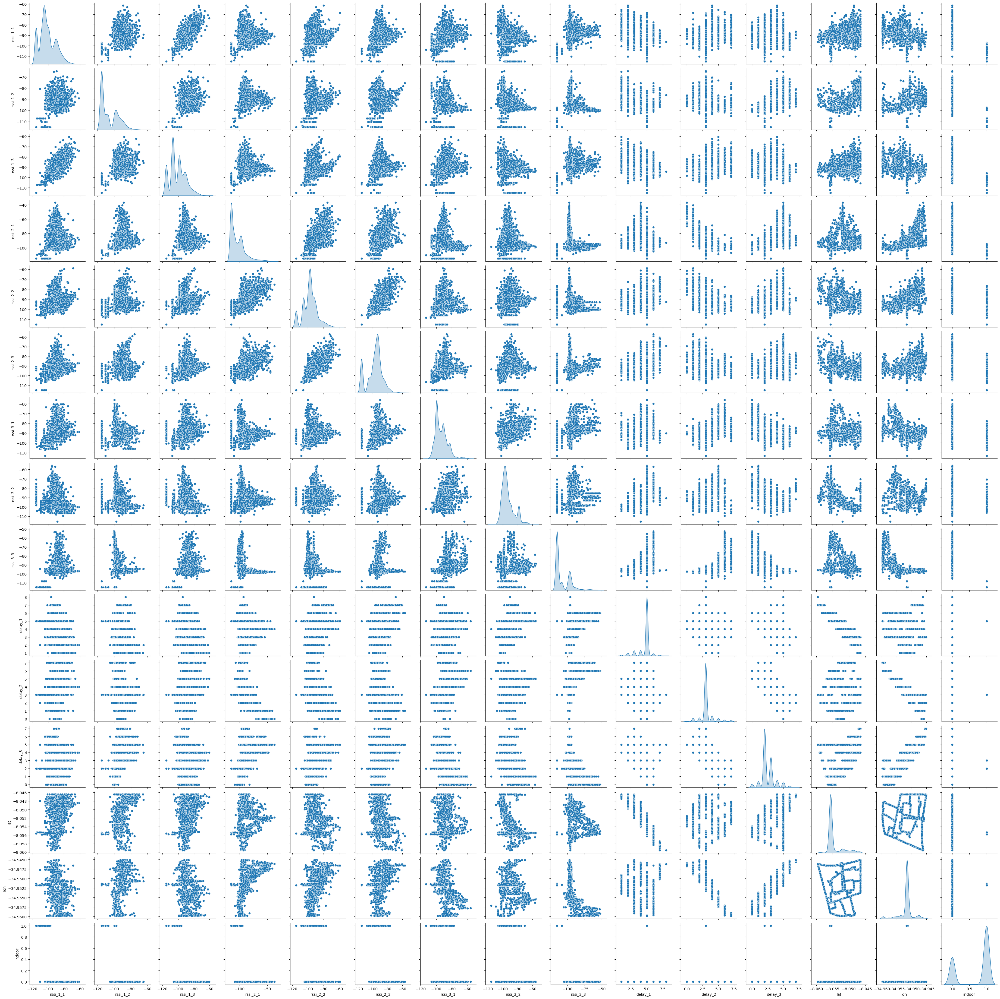

In [11]:
with sns.plotting_context():
    sns.pairplot(df_tr.drop(['ponto_id'], axis=1), diag_kind='kde')

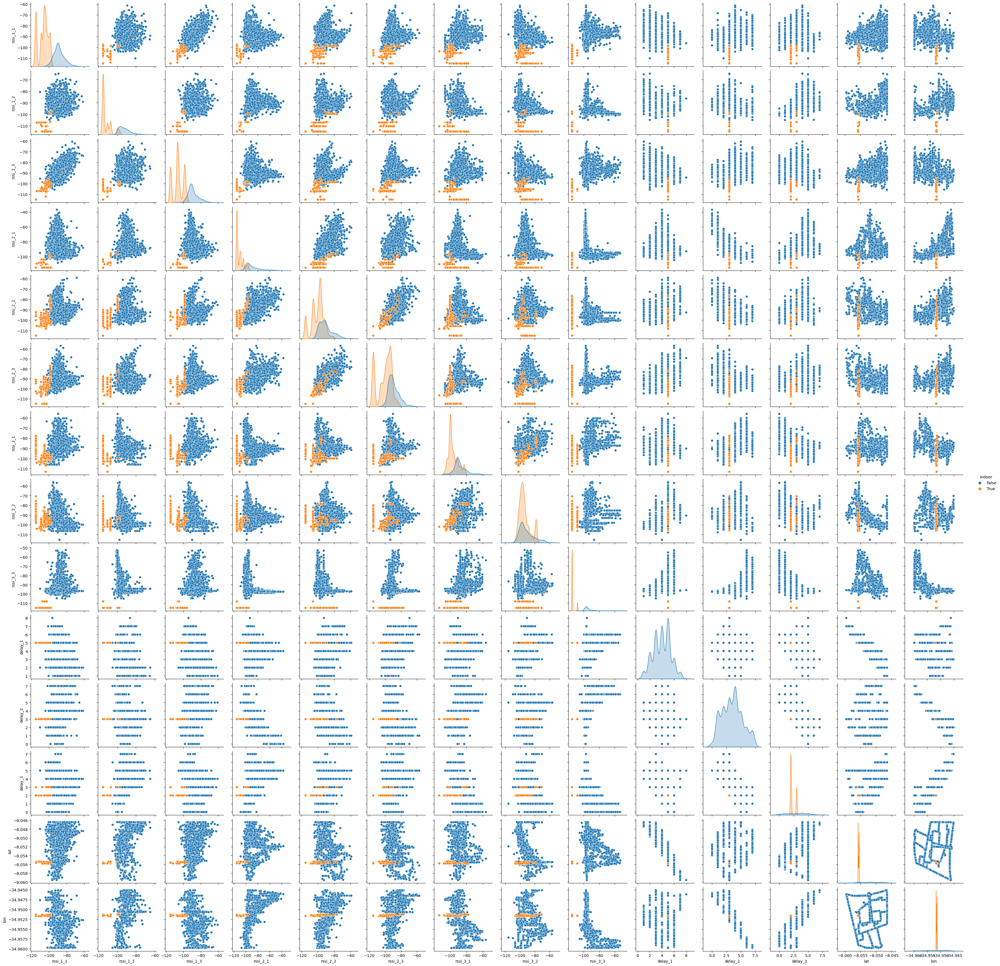

In [10]:
with sns.plotting_context():
    sns.pairplot(df_tr.drop(['ponto_id'], axis=1),  hue='indoor')

<Axes: >

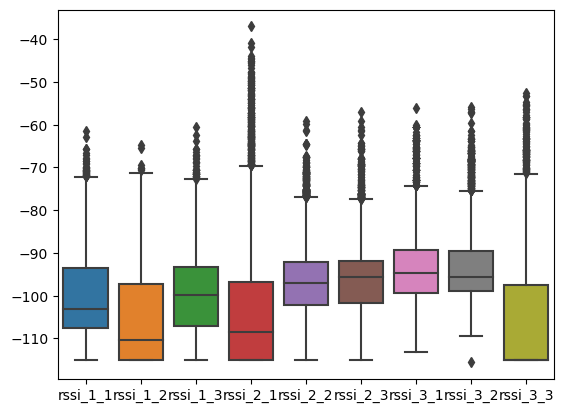

In [12]:
sns.boxplot(df_tr[['rssi_1_1', 'rssi_1_2', 'rssi_1_3', 'rssi_2_1', 'rssi_2_2',
       'rssi_2_3', 'rssi_3_1', 'rssi_3_2', 'rssi_3_3']])

<Axes: >

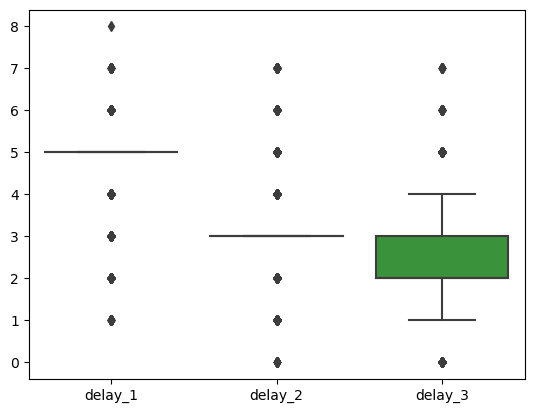

In [14]:
sns.boxplot(df_tr[['delay_1', 'delay_2',
       'delay_3']])

## Separando a Base em Treino e Teste

In [15]:
X_train, X_test, y_train, y_test = train_test_split(
    df_tr.drop(['ponto_id', 'lat', 'lon', 'indoor'], axis=1),
    df_tr[['lat', 'lon']],
    test_size=0.1, 
    random_state=42
)

## Pré-processamento

* Scaler

In [22]:
scaler_dtr = RobustScaler()
scaler_knr = RobustScaler()
scaler_rfr = RobustScaler()

## Definindo Modelos e Otimizador de Hiper-parâmetro

* Decision Tree Regressor

In [25]:
dtr = DecisionTreeRegressor(random_state=10)

In [26]:
param_tree = {
    'criterion': ["squared_error", "friedman_mse", "absolute_error"],
    'min_samples_split': [x for x in range(2, 101)],
    'min_samples_leaf': [x for x in range(2, 51)],
    'max_features':  ['auto','sqrt','log2'],
    'max_depth': [x for x in range(1, 31)],
    'splitter': ['best', 'random']
}

opt_dtr = BayesSearchCV(dtr, param_tree, n_iter=25, random_state=10)

* KNN

In [21]:
knr = KNeighborsRegressor()

In [27]:
param_knn = {
    'n_neighbors': [x for x in range(1, 101)],
    'weights': ['uniform', 'distance'],
    'p': [1, 2, 3]
}

opt_knr = BayesSearchCV(knr, param_knn, n_iter=25, random_state=10)

* Random Forest Regressor

In [31]:
rfr = RandomForestRegressor(random_state=10)

In [33]:
param_rf = {
    'n_estimators': [x for x in range(1, 51)],
    'criterion': ['squared_error', 'absolute_error', 'friedman_mse'],
    'min_samples_split': [x for x in range(2, 101)],
    'min_samples_leaf' : [x for x in range(2, 51)],
    'max_depth' : [x for x in range(1, 11)],
    'max_features' : ['auto','sqrt','log2']
 }

opt_rfr = BayesSearchCV(rfr, param_rf, n_iter=25, random_state=10)

## Conectando Pipelines

In [35]:
pipe_dtr = Pipeline(steps=[
    ('scaler', scaler_dtr),
    ('model', opt_dtr)
])

pipe_knr = Pipeline(steps=[
    ('scaler', scaler_knr),
    ('model', opt_knr)
])

pipe_rfr = Pipeline(steps=[
    ('scaler', scaler_rfr),
    ('model', opt_rfr)
])

## Treinando Modelos

> Função de avaliação

In [37]:
from sklearn.metrics import mean_squared_error, r2_score

def eval_regressor(X, y, model):
    print('RMSE:', mean_squared_error(y, model.predict(X), squared=False))
    print('R^2:', r2_score(y, model.predict(X)))

* DTR

In [36]:
pipe_dtr.fit(X_train, y_train)

C:\Users\Pichau\anaconda3\lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
C:\Users\Pichau\anaconda3\lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
C:\Users\Pichau\anaconda3\lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
C:\Users\Pichau\anaconda3\lib\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
C:\Users\Pic

Pipeline(steps=[('scaler', RobustScaler()),
                ('model',
                 BayesSearchCV(estimator=DecisionTreeRegressor(random_state=10),
                               n_iter=25, random_state=10,
                               search_spaces={'criterion': ['squared_error',
                                                            'friedman_mse',
                                                            'absolute_error'],
                                              'max_depth': [1, 2, 3, 4, 5, 6, 7,
                                                            8, 9, 10, 11, 12,
                                                            13, 14, 15, 16, 17,
                                                            18, 19, 20, 21, 22,
                                                            23, 24, 25, 26, 27,
                                                            28, 29, 30],
                                              'max_features': ['auto', 'sqrt',
                                                               'log2'],
                                              'min_samples_leaf': [2, 3, 4, 5,
                                                                   6, 7, 8, 9,
                                                                   10, 11, 12,
                                                                   13, 14, 15,
                                                                   16, 17, 18,
                                                                   19, 20, 21,
                                                                   22, 23, 24,
                                                                   25, 26, 27,
                                                                   28, 29, 30,
                                                                   31, ...],
                                              'min_samples_split': [2, 3, 4, 5,
                                                                    6, 7, 8, 9,
                                                                    10, 11, 12,
                                                                    13, 14, 15,
                                                                    16, 17, 18,
                                                                    19, 20, 21,
                                                                    22, 23, 24,
                                                                    25, 26, 27,
                                                                    28, 29, 30,
                                                                    31, ...],
                                              'splitter': ['best',
                                                           'random']}))])

In [43]:
pipe_dtr.steps[-1][-1].best_estimator_.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': 29,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 19,
 'min_samples_split': 52,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 10,
 'splitter': 'best'}

In [38]:
print('-----> Train:')
eval_regressor(X_train, y_train, pipe_dtr)
print('-----> Test:')
eval_regressor(X_test, y_test, pipe_dtr)

-----> Train:
RMSE: 0.0002538730436712967
R^2: 0.9882442630174575
-----> Test:
RMSE: 0.0002579151868017856
R^2: 0.9884374122856687


* KNR

In [44]:
pipe_knr.fit(X_train, y_train)

Pipeline(steps=[('scaler', RobustScaler()),
                ('model',
                 BayesSearchCV(estimator=KNeighborsRegressor(), n_iter=25,
                               random_state=10,
                               search_spaces={'n_neighbors': [1, 2, 3, 4, 5, 6,
                                                              7, 8, 9, 10, 11,
                                                              12, 13, 14, 15,
                                                              16, 17, 18, 19,
                                                              20, 21, 22, 23,
                                                              24, 25, 26, 27,
                                                              28, 29, 30, ...],
                                              'p': [1, 2, 3],
                                              'weights': ['uniform',
                                                          'distance']}))])

In [45]:
pipe_knr.steps[-1][-1].best_estimator_.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 6,
 'p': 1,
 'weights': 'uniform'}

In [46]:
print('-----> Train:')
eval_regressor(X_train, y_train, pipe_knr)
print('-----> Test:')
eval_regressor(X_test, y_test, pipe_knr)

-----> Train:
RMSE: 8.750702598672521e-05
R^2: 0.9986035877620445
-----> Test:
RMSE: 0.00011290061496270829
R^2: 0.9977862075223607


* RFR

In [81]:
pipe_rfr.fit(X_train, y_train)

C:\Users\Pichau\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
C:\Users\Pichau\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
C:\Users\Pichau\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomFore

Pipeline(steps=[('scaler', RobustScaler()),
                ('model',
                 BayesSearchCV(estimator=RandomForestRegressor(random_state=10),
                               n_iter=25, random_state=10,
                               search_spaces={'criterion': ['squared_error',
                                                            'absolute_error',
                                                            'friedman_mse'],
                                              'max_depth': [1, 2, 3, 4, 5, 6, 7,
                                                            8, 9, 10],
                                              'max_features': ['auto', 'sqrt',
                                                               'log2'],
                                              'min_samples_leaf': [2, 3, 4, 5,
                                                                   6, 7, 8, 9,
                                                                   10, 11, 12,
                                                                   13, 14, 15,
                                                                   16, 17, 18,
                                                                   19, 20, 21,
                                                                   22, 23, 24,
                                                                   25, 26, 27,
                                                                   28, 29, 30,
                                                                   31, ...],
                                              'min_samples_split': [2, 3, 4, 5,
                                                                    6, 7, 8, 9,
                                                                    10, 11, 12,
                                                                    13, 14, 15,
                                                                    16, 17, 18,
                                                                    19, 20, 21,
                                                                    22, 23, 24,
                                                                    25, 26, 27,
                                                                    28, 29, 30,
                                                                    31, ...],
                                              'n_estimators': [1, 2, 3, 4, 5, 6,
                                                               7, 8, 9, 10, 11,
                                                               12, 13, 14, 15,
                                                               16, 17, 18, 19,
                                                               20, 21, 22, 23,
                                                               24, 25, 26, 27,
                                                               28, 29, 30, ...]}))])

In [82]:
pipe_rfr.steps[-1][-1].best_estimator_.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'absolute_error',
 'max_depth': 6,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 11,
 'min_samples_split': 12,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 32,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 10,
 'verbose': 0,
 'warm_start': False}

In [83]:
print('-----> Train:')
eval_regressor(X_train, y_train, pipe_rfr)
print('-----> Test:')
eval_regressor(X_test, y_test, pipe_rfr)

-----> Train:
RMSE: 0.0002535733928454775
R^2: 0.9882295889127025
-----> Test:
RMSE: 0.0002715927374527435
R^2: 0.9870910143250163


## Avaliando Performance

### Definindo Funções

* Distância em metro entre os pontos

In [66]:
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371e3 # em metros
    phi1 = lat1 * math.pi/180 # Radianos
    phi2 = lat2 * math.pi/180

    delta_phi = (lat2-lat1) * math.pi/180 # Radianos
    delta_lambda = (lon2 - lon1) * math.pi/180

    a = np.sin(delta_phi/2.)**2 + \
        np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda/2.)**2
    c = 2 * np.arcsin(np.sqrt(a))

    return c * R

* Histograma errors

In [79]:
def plot_histogram_errors(lat_pred, lon_pred, lat_real, lon_real):
    dist = haversine_distance(lat_pred, lon_pred, lat_real, lon_real)

    with sns.plotting_context():
        sns.set(rc={'figure.figsize':(11.7,8.27)})
        ax = sns.histplot(dist, kde=True)
        ax.set(xlabel='Errors')
        plt.show()

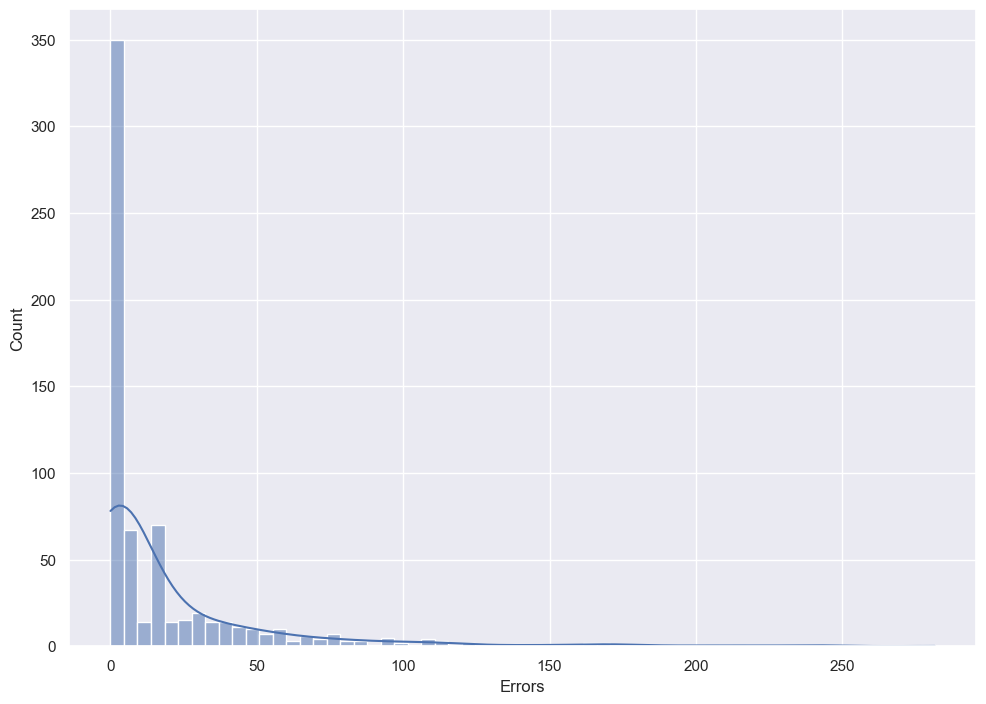

In [86]:
plot_histogram_errors(pipe_rfr.predict(X_test)[:, 0], pipe_rfr.predict(X_test)[:, 1], y_test.values[:, 0], y_test.values[:, 1])

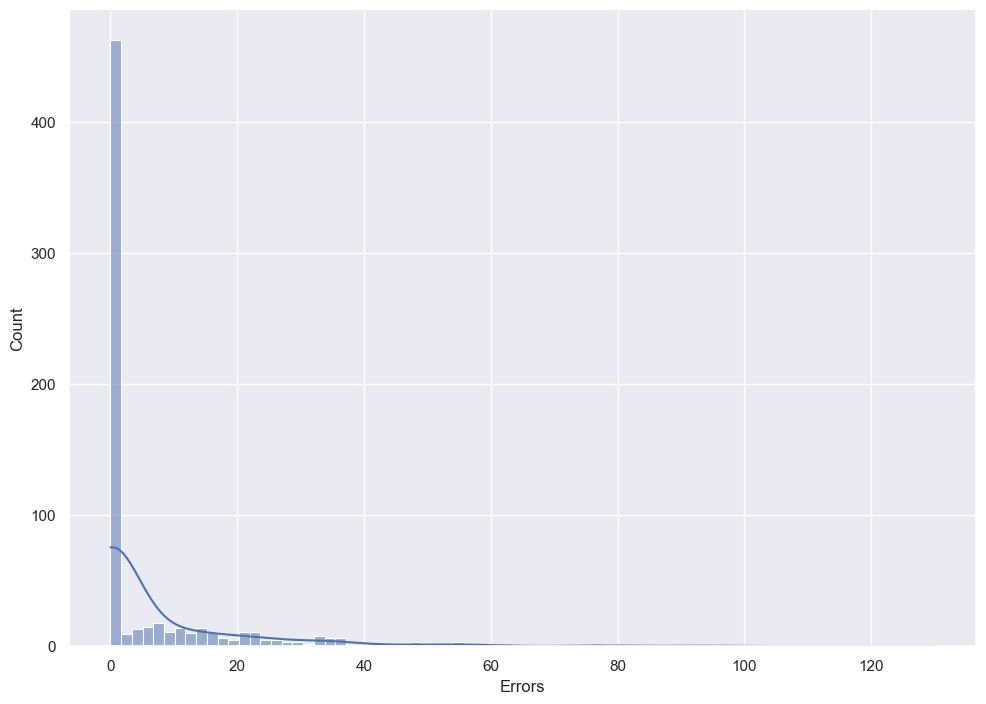

In [87]:
plot_histogram_errors(pipe_knr.predict(X_test)[:, 0], pipe_knr.predict(X_test)[:, 1], y_test.values[:, 0], y_test.values[:, 1])

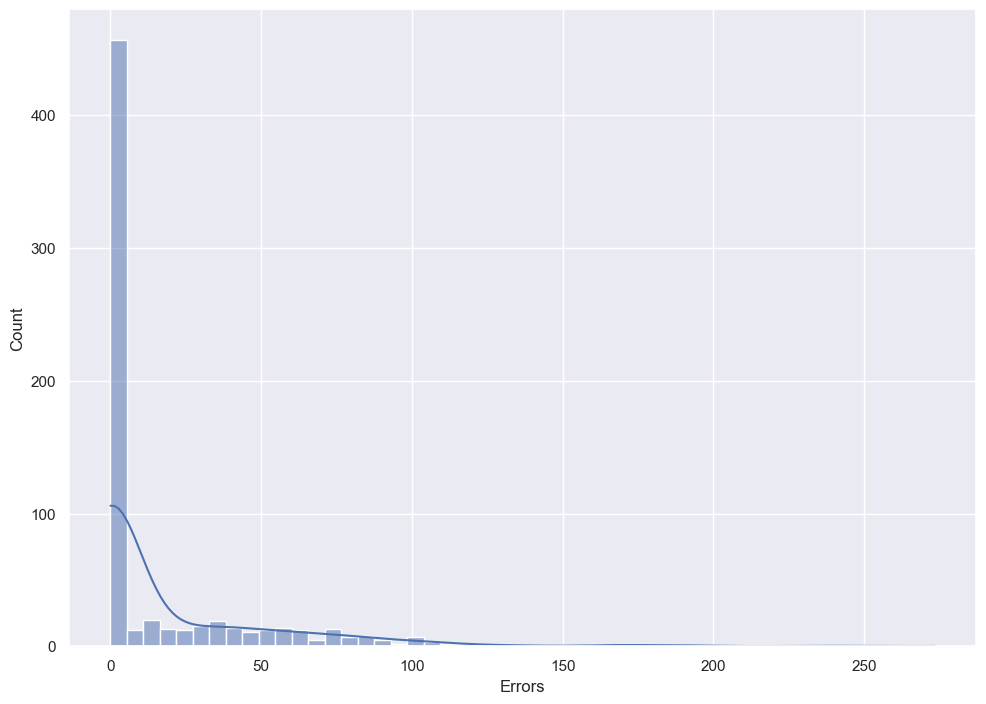

In [88]:
plot_histogram_errors(pipe_dtr.predict(X_test)[:, 0], pipe_dtr.predict(X_test)[:, 1], y_test.values[:, 0], y_test.values[:, 1])

* Boxplot

In [91]:
def plot_boxplot_errors(lat_pred, lon_pred, lat_real, lon_real):
    dist = haversine_distance(lat_pred, lon_pred, lat_real, lon_real)

    with sns.plotting_context():
        sns.set(rc={'figure.figsize':(11.7,8.27)})
        ax=sns.boxplot(dist)
        ax.set(ylabel='Errors')
        plt.show()

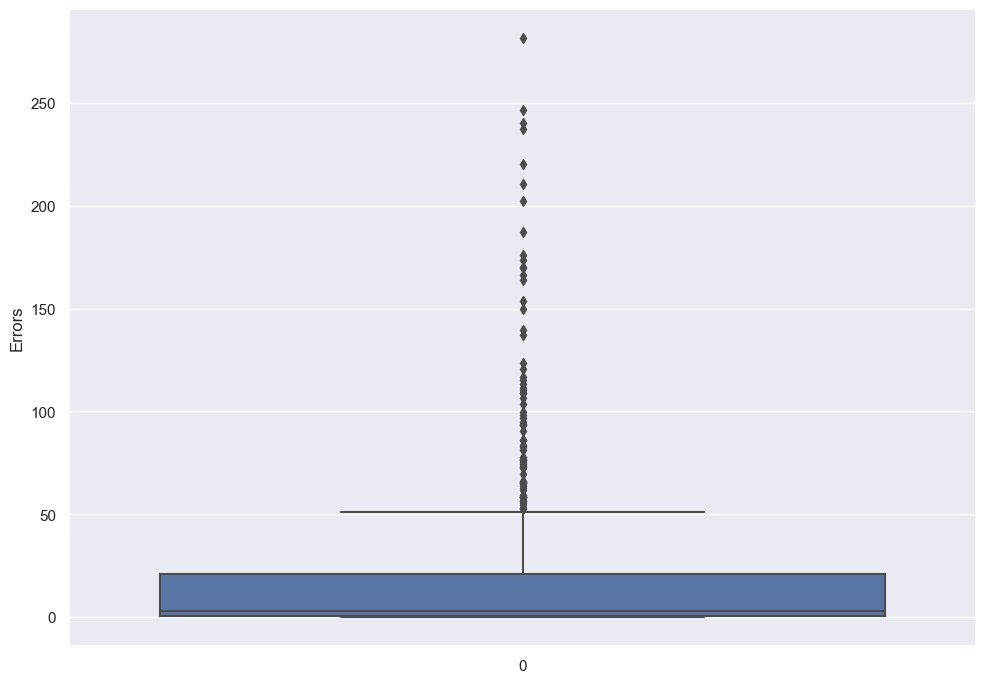

In [92]:
plot_boxplot_errors(pipe_rfr.predict(X_test)[:, 0], pipe_rfr.predict(X_test)[:, 1], y_test.values[:, 0], y_test.values[:, 1])

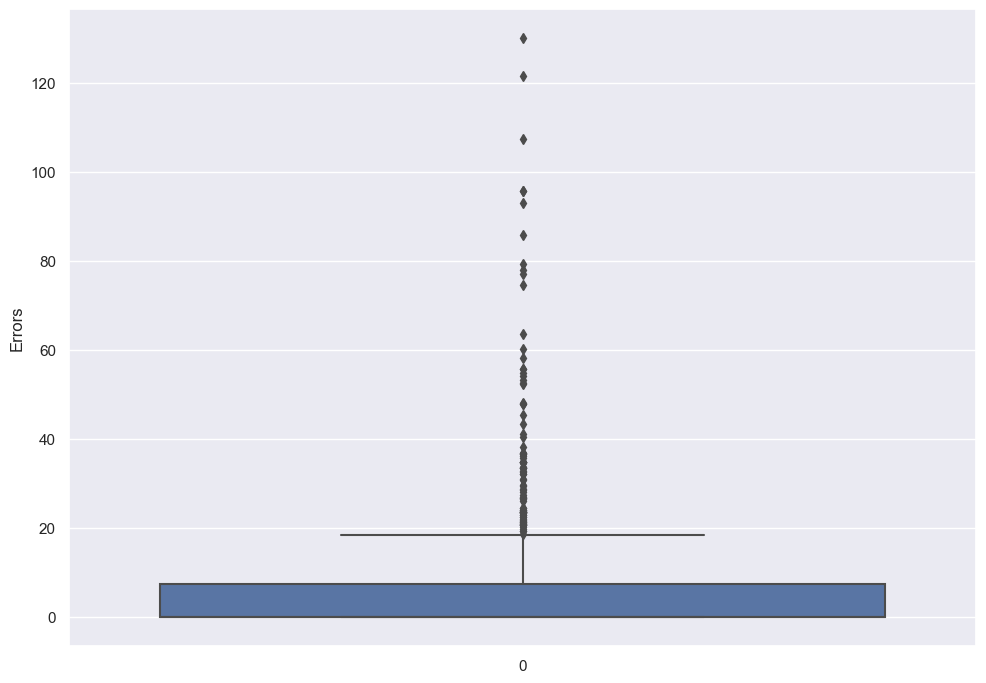

In [93]:
plot_boxplot_errors(pipe_knr.predict(X_test)[:, 0], pipe_knr.predict(X_test)[:, 1], y_test.values[:, 0], y_test.values[:, 1])

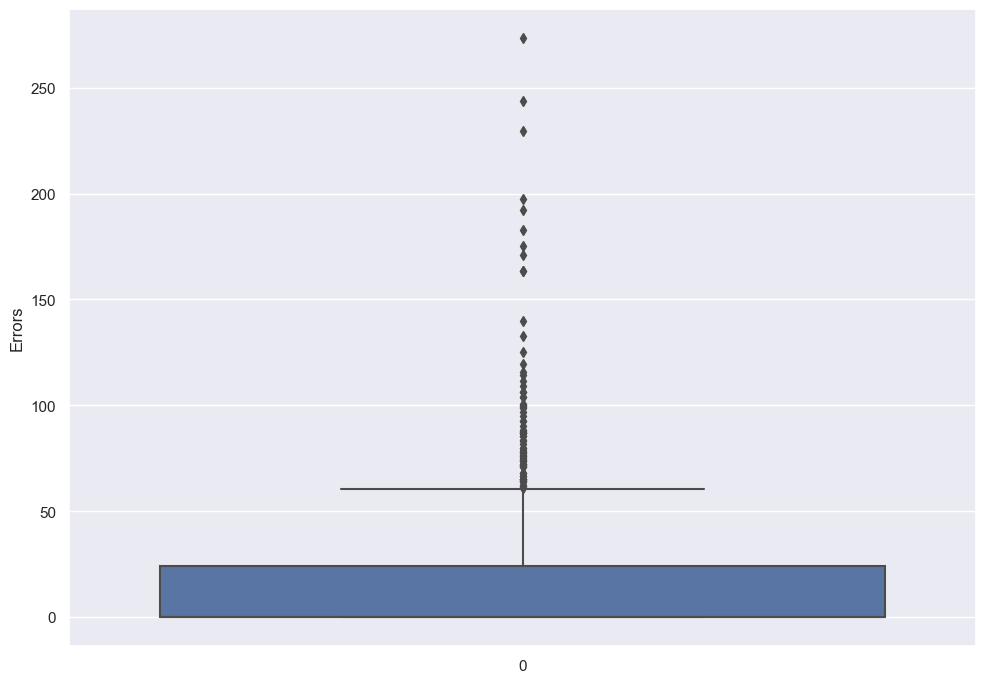

In [94]:
plot_boxplot_errors(pipe_dtr.predict(X_test)[:, 0], pipe_dtr.predict(X_test)[:, 1], y_test.values[:, 0], y_test.values[:, 1])

* Mapa de comparação

In [146]:
def plot_map_coordinates(lat_pred, lon_pred, lat_real, lon_real):
    ufpe_lat = -8.05055754239243
    ufpe_lon = -34.95075894852773

    map=folium.Map(location=[ufpe_lat,ufpe_lon])

    for i in range(len(lat_pred)):
        map.add_child(folium.Marker(location=[lat_pred[i], lon_pred[i]], 
                                            popup=i, icon=folium.Icon(color='red', icon='fa-flag')))
        map.add_child(folium.Marker(location=[lat_real[i], lon_real[i]], 
                                            popup=i, icon=folium.Icon(color='blue', icon='fa-flag')))

    sw = [lat_real.min(), lon_real.min()]
    ne = [lat_real.max(), lon_real.max()]
    map.fit_bounds([sw, ne]) 

    map.save('teste.html')
    return map

In [153]:
map = plot_map_coordinates(pipe_knr.predict(X_test)[:, 0], pipe_knr.predict(X_test)[:, 1], y_test.values[:, 0], y_test.values[:, 1])

In [154]:
map

In [152]:
map = plot_map_coordinates(pipe_dtr.predict(X_test)[:, 0], pipe_dtr.predict(X_test)[:, 1], y_test.values[:, 0], y_test.values[:, 1])
map

In [155]:
map = plot_map_coordinates(pipe_rfr.predict(X_test)[:, 0], pipe_rfr.predict(X_test)[:, 1], y_test.values[:, 0], y_test.values[:, 1])
map